In [149]:
import random
import json, pickle
import re
import os

from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix

random.seed(6)
np.random.seed(6)

WORK_DIR = Path.cwd().parent


In [150]:
import sys
sys.path.append(str(WORK_DIR))
from src.datasets import STARDataset
from src import prompt_formatters
from src.STAR_utils.visualization_tools import qa_visualization as qaviz


In [151]:
RAW_VIDEO_DIR = Path(WORK_DIR / 'data/datasets/action-genome/Charades_v1_480/')
RAW_FRAME_DIR = Path(WORK_DIR / 'data/datasets/action-genome/frames/')
ANNOTATION_DIR = Path(WORK_DIR / 'src/STAR_utils/annotations/STAR_classes/')
FPS = pickle.load(open(ANNOTATION_DIR / 'video_fps','rb'))

SAVE_VIDEO_DIR = Path(WORK_DIR / "experiments/video_dump")


# Experiment - Gemma3 4b it-qat

Analysis on the performance of Gemma3 4b instruction tuned quantization aware training on the scene graphs generated by the VLM.

**Parameters:**
- model: Gemma3 4b instruction-tuned quantization-aware-training
- system prompt: MCQ_system_promtp_ZS_CoT.txt
- user_prompt: MCQ_user_prompt_ZS_CoT_v2.txt
- temperature: 0.1
- sampling method: (default) top-p (p=0.9)


## Prompts

In [152]:
with open(WORK_DIR / 'data/prompts/zero-shot-cot/MCQ_system_prompt_ZS_CoT.txt', 'r') as f:
    pr = f.read()

print(pr)


You need to respond to reasoning questions by making logical inference on sequence of Scene-Graphs extracted from frames belonging to a video, called a Spatio-Temporal Scene Graph.

IMPORTANT CLARIFICATIONS:
- You will receive a question and Spatio-Temporal Scene-Graph
- Each Scene-Graph is a static symbolic representation of the scene unfolding in the frame
- The Scene-Graphs are ordered chronologically
- The Scene-Graph is represented as a set of tuple in the format: subject - relationship - object
- The Spatio-Temporal Scene-Graph is a cornologically sorted list of Scene-Graphs

INSTRUCTIONS:
- Read the entire Spatio-Temporal Scene-Graphs in chronological order and pay attention at the order of how events unfold.
- Read the question and reason about the answer step by step.
- In your answer include key events or relationships that help you in determing the correct answer.
- Be careful to reproduce the chosen alternative as it is presented.


In [153]:
with open(WORK_DIR / "data/prompts/zero-shot-cot/MCQ_user_prompt_ZS_CoT_v3.txt", 'r') as f:
    pr = f.read()

print(pr)


Please carefully read the following Spatio-Temporal Scene Graph delimited by the <STSG> tags and provide an answer to the question below:

<STSG>
{stsg}
</STSG>

Given the following question:
<Q>
{question}
<Q>

And the following alternatives:
<Alternatives>
A. {c1}
B. {c2}
C. {c3}
D. {c4}
</Alternatives>

Provide an answer to the above question reasoning step by step on the Spatio-Temporal Scene-Graph (STSG) and choosing one of the alternatives. 

In answering the question please be sure to operate according to the following guidlines:
1. Question Interpretation: Clearly state what the question is asking
2. STSG Analysis: Carefully examine the spatial and temporal relationships in the scene graph
3. Alternative Evaluation: For each option (A, B, C, D), explain whether it matches the STSG evidence
4. Reasoning: Provide clear logical step by step reasoning leading to your conclusion
5. Conclusion: Declare the logical conclusion to your reasoning in the above step
6. Consistency Check: B

In [154]:
with open(WORK_DIR / "data/prompts/zero-shot-cot/auto_reply_ZS_CoT.txt", 'r') as f:
    reply = f.read()

print(reply)


Therefore the final answer is?

Your response must be provided in valid JSON format as follows:
{"answer": "your complete answer here"}

IMPORTANT: Always include both the letter (A, B, C, D, etc.) AND the full text of the answer in your response.
Do not abbreviate or shorten the answer. For example, if the correct answer is "A. the laptop", your response 
should be {"answer": "A. the laptop"}, not {"answer": "laptop"} or {"answer": "A"}.\



In [155]:
with open(WORK_DIR / 'data/datasets/STAR/STAR_annotations/STAR_val_small_1200.json') as f:
    data = json.load(f)
    


In [156]:
data[0]['choices']


[{'choice_id': 0,
  'choice': 'The bag.',
  'choice_program': [{'function': 'Belong_to', 'value_input': ['bag']}]},
 {'choice_id': 1,
  'choice': 'The book.',
  'choice_program': [{'function': 'Belong_to', 'value_input': ['book']}]},
 {'choice_id': 2,
  'choice': 'The blanket.',
  'choice_program': [{'function': 'Belong_to', 'value_input': ['blanket']}]},
 {'choice_id': 3,
  'choice': 'The clothes.',
  'choice_program': [{'function': 'Belong_to', 'value_input': ['clothes']}]}]

Let's load the ground truth from the `STAR_QA_question_and_stsg_val.json` file where we extracted QA and spatio-temporal scene graphs

In [157]:
ground_truth = []

with open(WORK_DIR / 'data/datasets/STAR/STAR_annotations/STAR_val_small_1000.json') as f:
    data = json.load(f)
    ground_truth = [{
        'id': sample['question_id'],
        'question': sample['question'],
        'choices': sample['choices'],
        'text': sample['answer'],
    } for sample in data]


# we keep num as str so we can directrly access choices dictionaries
gt_df = pd.DataFrame(ground_truth).astype({'id': 'string', 'text': 'string'})
#gt_df.set_index('id', inplace=True)
gt_df


,id,question,choices,text
0,Feasibility_T5_102,Which object is the person able to throw after...,"[{'choice_id': 0, 'choice': 'The bag.', 'choic...",The clothes.
1,Feasibility_T2_860,What else is the person able to do with the wi...,"[{'choice_id': 0, 'choice': 'Lie on the window...",Close the window.
2,Feasibility_T2_556,What else is the person able to do with the cl...,"[{'choice_id': 0, 'choice': 'Tidy up the close...",Open the closet/cabinet.
3,Prediction_T1_2539,What will the person do next?,"[{'choice_id': 0, 'choice': 'Sit on the floor....",Sit on the floor.
4,Prediction_T4_1253,Which object would the person throw next after...,"[{'choice_id': 0, 'choice': 'The pillow.', 'ch...",The shoe.
...,...,...,...,...
1043,Interaction_T1_8913,Which object was taken by the person?,"[{'choice_id': 0, 'choice': 'The paper/noteboo...",The paper/notebook.
1044,Interaction_T1_8967,Which object was taken by the person?,"[{'choice_id': 0, 'choice': 'The towel.', 'cho...",The dish.
1045,Interaction_T2_1847,What did the person do with the paper/notebook?,"[{'choice_id': 0, 'choice': 'Put down.', 'choi...",Took.
1046,Interaction_T2_3423,What did the person do with the bed?,"[{'choice_id': 0, 'choice': 'Sat on.', 'choice...",Lied on.


In [158]:
gt_df['id'].nunique()


1048

In [159]:
gt_df.drop_duplicates(
    subset=['id'],
    keep='first',
    inplace=True
)
gt_df.set_index('id', inplace=True)


## Loading predicted answers evaluation

In [160]:
predictions = []
with open(WORK_DIR / 'outputs/responses_on_small_val_gemma3:4b-it-qat_20250609_21:50:00.jsonl', mode='r', encoding='utf-8', errors='strict') as f:
    predictions = [json.loads(line) for line in f.readlines()]

# transforming the id key from `qid` to `id` for consistency and `response` to `answer`
predictions_df = pd.DataFrame(predictions, dtype='string').rename(columns={'qid':'id', 'response':'answer'})
predictions_df


,id,chat_history
0,Feasibility_T5_102,"[{'role': 'user', 'content': 'Please carefully..."
1,Feasibility_T2_860,"[{'role': 'user', 'content': 'Please carefully..."
2,Feasibility_T2_556,"[{'role': 'user', 'content': 'Please carefully..."
3,Prediction_T1_2539,"[{'role': 'user', 'content': 'Please carefully..."
4,Prediction_T4_1253,"[{'role': 'user', 'content': 'Please carefully..."
...,...,...
1193,Interaction_T2_6916,"[{'role': 'user', 'content': 'Please carefully..."
1194,Sequence_T4_3501,"[{'role': 'user', 'content': 'Please carefully..."
1195,Feasibility_T2_126,"[{'role': 'user', 'content': 'Please carefully..."
1196,Prediction_T4_1007,"[{'role': 'user', 'content': 'Please carefully..."


In [161]:
len(set(predictions_df.index))


1198

In [162]:
predictions_df.drop_duplicates(
    subset=['id'],
    keep='first',
    inplace=True
)
predictions_df.set_index('id', inplace=True)


In [163]:
predictions_df['chat_history'] = \
    predictions_df['chat_history'] \
    .apply(lambda x: eval(x))

predictions_df


,chat_history
id,
Feasibility_T5_102,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T2_860,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T2_556,"[{'role': 'user', 'content': 'Please carefully..."
Prediction_T1_2539,"[{'role': 'user', 'content': 'Please carefully..."
Prediction_T4_1253,"[{'role': 'user', 'content': 'Please carefully..."
...,...
Interaction_T3_612,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T2_6916,"[{'role': 'user', 'content': 'Please carefully..."
Sequence_T4_3501,"[{'role': 'user', 'content': 'Please carefully..."


In [164]:
predictions_df['reasoning'] = predictions_df['chat_history'].apply(lambda x: x[1]['content'])
predictions_df['answer'] = predictions_df['chat_history'].apply(lambda x: x[-1]['content'])


In [165]:
predictions_df['reasoning'].iloc[0:5] 


id
Feasibility_T5_102    Okay, let's analyze the Spatio-Temporal Scene ...
Feasibility_T2_860    Okay, let's analyze the Spatio-Temporal Scene ...
Feasibility_T2_556    Okay, let's analyze the Spatio-Temporal Scene ...
Prediction_T1_2539    Okay, let's analyze the Spatio-Temporal Scene ...
Prediction_T4_1253    Okay, let's analyze the Spatio-Temporal Scene ...
Name: reasoning, dtype: object

In [166]:
predictions_df['answer'].iloc[0:5] 


id
Feasibility_T5_102               ```json\n{"answer": "A. The bag"}\n```
Feasibility_T2_860      ```json\n{"answer": "D. Open the window."}\n```
Feasibility_T2_556    ```json\n{"answer": "B. Open the closet/cabine...
Prediction_T1_2539     ```json\n{"answer": "A. Sit on the floor."}\n```
Prediction_T4_1253    {"answer": "The question cannot be answered wi...
Name: answer, dtype: object

## Text preprocessing

For Gemma we need to be more careful becuase the format is different, it encapsulated the json output in the with the tokens: 
```
```json\n
<actual_answer>
\n```
```

In [167]:

# Create mask for answers that follow JSON syntax
json_mask = predictions_df['answer'].str.match(r'^(```json\s)?({[^}]+})(\s```)?$')
matches_json_template = json_mask.sum()

print(f"Total answers: {len(predictions_df)}")
print(f"Answers following JSON template: {matches_json_template}")
print(f"Percentage following JSON template: {(matches_json_template/len(predictions_df))*100:.2f}%")


Total answers: 1030
Answers following JSON template: 1030
Percentage following JSON template: 100.00%


In [168]:
predictions_df.loc[~json_mask, 'answer']


Series([], Name: answer, dtype: object)

In [169]:
predictions_df.loc[json_mask, 'answer'] = \
    predictions_df.loc[json_mask, 'answer'] \
    .apply(lambda x: re.search(r'^(?:```json\s)?({[^}]+})(?:\s```)?$', x).group(1))

predictions_df.loc[~json_mask, 'answer'] = ""
predictions_df['answer']


id
Feasibility_T5_102                              {"answer": "A. The bag"}
Feasibility_T2_860                     {"answer": "D. Open the window."}
Feasibility_T2_556             {"answer": "B. Open the closet/cabinet."}
Prediction_T1_2539                    {"answer": "A. Sit on the floor."}
Prediction_T4_1253     {"answer": "The question cannot be answered wi...
                                             ...                        
Interaction_T3_612     {"answer": "None of the provided alternatives ...
Interaction_T2_6916    {"answer": "None of the alternatives can be se...
Sequence_T4_3501                      {"answer": "A. Sat at the table."}
Prediction_T4_1007                           {"answer": "A. The laptop"}
Interaction_T2_3912                             {"answer": "B. Opened."}
Name: answer, Length: 1030, dtype: object

### Applying changes

In [170]:
# Replace new line (lead to EOF Errors) with whitespace
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('\n+', ' ', regex=True)

# Replace lef and right quotation mark with simple quotation mark
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('[\u2018-\u201b]', '\'', regex=True)
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('[\u201c\u201d]', '"', regex=True)
# ------------------ Removing inner double quotes --------------------
# It may happen that the text may contain inner double quotes before the
# attribute end. This will cause the parser to termiate early and spout
# errors for the remaining text. With this snippet we replace those inner
# double quotes with single quotes.
#  
# we first match the text of the reason paramter inside the double quotes
# then we escape/replace all the double quotes inside the text
inside_doublequotes = r"(?<=\"answer\": \")(.*)(?=\"(?:,|}))"

predictions_df['answer'] = \
    predictions_df.apply(
        func=lambda row: re.sub(
            inside_doublequotes, 
            lambda matchobj: matchobj.group(0).replace('\"', ''), 
            row['answer']),
        axis=1
        )


In [171]:
predictions_df.loc[json_mask, 'answer'] = predictions_df.loc[json_mask, 'answer'].apply(lambda x: eval(x)['answer'].strip())
predictions_df


,chat_history,reasoning,answer
id,,,
Feasibility_T5_102,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",A. The bag
Feasibility_T2_860,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",D. Open the window.
Feasibility_T2_556,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",B. Open the closet/cabinet.
Prediction_T1_2539,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",A. Sit on the floor.
Prediction_T4_1253,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",The question cannot be answered with certainty...
...,...,...,...
Interaction_T3_612,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",None of the provided alternatives directly des...
Interaction_T2_6916,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",None of the alternatives can be selected becau...
Sequence_T4_3501,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",A. Sat at the table.


In [172]:
ans_regex_pattern = r'^(?:[A-Z]\.)\s+((?:\w+(?:\s|\/)?){,10}\.?)'
contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, regex=True)

print(f"Answer following the template: {contains_answer.value_counts()[True]}\n"
      f"{contains_answer.value_counts()[True]/predictions_df.shape[0]:.2%} of the total")

print(f"\nOnly {contains_answer.value_counts()[False]} samples do not contain the answer in the response with the specified format")


Answer following the template: 838
81.36% of the total

Only 192 samples do not contain the answer in the response with the specified format


/tmp/ipykernel_307717/3127831504.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, regex=True)


In [175]:
print("\n".join(predictions_df.loc[~contains_answer, 'answer'].values))


The question cannot be answered with certainty based on the provided scene graph. Since the scene graph does not provide any information about what the person is carrying besides the backpack, and the question asks what they would *throw* next, the best answer is that they would throw something from their backpack. However, the alternatives don't provide any information about what is in the backpack.
None of the provided alternatives
None of the provided alternatives accurately describe the action. The person was holding the book.
None of the alternatives are present in the scene graph.
None of the alternatives are correct.
None of the provided alternatives accurately describe the object the person took. The scene graph describes a person holding a dark object, but doesn't specify what that object is or that they 'took' it.
None of the provided alternatives
None of the alternatives
None of the provided alternatives accurately describe an action the person is able to do when they are be

In [26]:
len(set(predictions_df.index))


1030

## Extract answers

In [27]:
ans_df = \
    predictions_df[contains_answer]['answer'] \
    .apply(lambda x: re.findall(ans_regex_pattern, x)[-1]) \
    .apply(lambda x: x + '.' if not x.endswith('.') else x) \
    .to_frame(name='text')

ans_df.rename(columns={0: 'text'}, inplace=True)

ans_df['text'] = ans_df['text'].str.strip()
ans_df['text'] = ans_df['text'].str.lower()
ans_df['reasoning'] = predictions_df['reasoning']
ans_gen_stsg_df = ans_df
ans_gen_stsg_df


,text,reasoning
id,,
Feasibility_T5_102,the bag.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Feasibility_T2_860,open the window.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Feasibility_T2_556,open the closet/cabinet.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Prediction_T1_2539,sit on the floor.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Interaction_T1_5612,the laptop.,"Okay, let's analyze the Spatio-Temporal Scene ..."
...,...,...
Interaction_T1_5491,the bag.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Sequence_T5_6297,put down.,"Okay, let's analyze the scene graph to answer ..."
Sequence_T4_3501,sat at the table.,"Okay, let's analyze the Spatio-Temporal Scene ..."


In [28]:
ans_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 838 entries, Feasibility_T5_102 to Interaction_T2_3912
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   text       838 non-null    object
 1   reasoning  838 non-null    object
dtypes: object(2)
memory usage: 19.6+ KB


In [29]:
# Inner join - keeps only indices present in both series

ans_df_tmp = ans_df.rename(columns={'text': 'pred_text'})
eval_df = gt_df.join(
    ans_df_tmp, 
    how='inner' # we account also for samples without answers
)

eval_df.shape


(838, 5)

In [30]:
def accuracy(eval_df, on_what='text'):
    hits_text = (eval_df[f'pred_{on_what}'].str.lower() == eval_df[on_what].str.lower()).sum()
    

    return hits_text/eval_df.shape[0]


In [31]:
def print_acc(eval_df, acc_fn):
    print(f"{'Question type':<15}{'Total':^15}{'Accuracy':^10}\n")

    total = eval_df.index.str.startswith('Interaction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Interaction')])
    print(f"{'Interaction':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Sequence').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Sequence')])
    print(f"{'Sequence':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Prediction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Prediction')])
    print(f"{'Prediction':<15}{total:^15}{acc:^10.2%}")

    total = eval_df.index.str.startswith('Feasibility').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Feasibility')])
    print(f"{'Feasibility':<15}{total:^15}{acc:^10.2%}")


In [32]:
print_acc(eval_df, lambda x: accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction          221        39.82%  
Sequence             229        41.92%  
Prediction           210        41.43%  
Feasibility          178        42.70%  


In [33]:
# % of answers conforming to template per category

def print_ans_perc(eval_df, gt_df):
    print(f"{'Question type':<15}{'Total':^15}{'Answered':^10}\n")

    total = gt_df.index.str.startswith('Interaction').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Interaction')].index))/total
    print(f"{'Interaction':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Sequence').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Sequence')].index))/total
    print(f"{'Sequence':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Prediction').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Prediction')].index))/total
    print(f"{'Prediction':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.index.str.startswith('Feasibility').sum()
    acc = len(gt_df.index.intersection(eval_df[eval_df.index.str.startswith('Feasibility')].index))/total
    print(f"{'Feasibility':<15}{total:^15}{acc:^10.2%}")

    total = gt_df.shape[0]
    acc = eval_df.shape[0]/total
    print(f"{'Overall':<15}{total:^15}{acc:^10.2%}")

print_ans_perc(eval_df, gt_df)


Question type       Total      Answered 

Interaction          298        74.16%  
Sequence             291        78.69%  
Prediction           239        87.87%  
Feasibility          220        80.91%  
Overall             1048        79.96%  


## Loading predicted answers - ground truth stsg as input

In [34]:
predictions = []
with open(WORK_DIR / 'outputs/responses_gemma3:4b_20250323_20:38:00.jsonl', mode='r', encoding='utf-8', errors='strict') as f:
    predictions = [json.loads(line) for line in f.readlines()]

# transforming the id key from `qid` to `id` for consistency and `response` to `answer`
predictions_df = pd.DataFrame(predictions, dtype='string').rename(columns={'qid':'id', 'response':'answer'})
predictions_df.set_index('id', inplace=True)
predictions_df



,chat_history
id,
Interaction_T1_13,"[{'role': 'user', 'content': ""Please carefully..."
Interaction_T1_14,"[{'role': 'user', 'content': ""Please carefully..."
Interaction_T1_31,"[{'role': 'user', 'content': ""Please carefully..."
Interaction_T1_32,"[{'role': 'user', 'content': ""Please carefully..."
Interaction_T1_40,"[{'role': 'user', 'content': ""Please carefully..."
...,...
Feasibility_T6_1453,"[{'role': 'user', 'content': ""Please carefully..."
Feasibility_T6_1454,"[{'role': 'user', 'content': ""Please carefully..."
Feasibility_T6_1455,"[{'role': 'user', 'content': ""Please carefully..."


In [35]:
predictions_df['chat_history'] = \
    predictions_df['chat_history'] \
    .apply(lambda x: eval(x))

predictions_df


,chat_history
id,
Interaction_T1_13,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_14,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_31,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_32,"[{'role': 'user', 'content': 'Please carefully..."
Interaction_T1_40,"[{'role': 'user', 'content': 'Please carefully..."
...,...
Feasibility_T6_1453,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T6_1454,"[{'role': 'user', 'content': 'Please carefully..."
Feasibility_T6_1455,"[{'role': 'user', 'content': 'Please carefully..."


In [36]:
predictions_df['reasoning'] = predictions_df['chat_history'].apply(lambda x: x[1]['content'])
predictions_df['answer'] = predictions_df['chat_history'].apply(lambda x: x[-1]['content'])


In [37]:
predictions_df['reasoning'].iloc[0:5] 


id
Interaction_T1_13    Okay, let's analyze the Spatio-Temporal Scene ...
Interaction_T1_14    Let's analyze the Spatio-Temporal Scene Graph ...
Interaction_T1_31    Let's analyze the Spatio-Temporal Scene Graph ...
Interaction_T1_32    Let's analyze the STSG to determine which obje...
Interaction_T1_40    Let's analyze the STSG to determine which obje...
Name: reasoning, dtype: object

In [38]:
predictions_df['answer'].iloc[0:5] 


id
Interaction_T1_13     ```json\n{"answer": "C. The clothes"}\n```
Interaction_T1_14    ```json\n{"answer": "C. The clothes."}\n```
Interaction_T1_31     ```json\n{"answer": "C. The clothes"}\n```
Interaction_T1_32       ```json\n{"answer": "B. The shoe."}\n```
Interaction_T1_40    ```json\n{"answer": "C. The blanket."}\n```
Name: answer, dtype: object

## Text preprocessing

For Gemma we need to be more careful becuase the format is different, it encapsulated the json output in the with the tokens: 
```
```json\n
<actual_answer>
\n```
```

In [39]:

# Create mask for answers that follow JSON syntax
json_mask = predictions_df['answer'].str.match(r'^(```json\s)?({[^}]+})(\s```)?$')
matches_json_template = json_mask.sum()

print(f"Total answers: {len(predictions_df)}")
print(f"Answers following JSON template: {matches_json_template}")
print(f"Percentage following JSON template: {(matches_json_template/len(predictions_df))*100:.2f}%")


Total answers: 7098
Answers following JSON template: 7097
Percentage following JSON template: 99.99%


In [40]:
predictions_df.loc[~json_mask, 'answer']


id
Prediction_T4_1351    ```json\n{"answer": "Therefore the final answe...
Name: answer, dtype: object

In [41]:
predictions_df.loc[json_mask, 'answer'] = \
    predictions_df.loc[json_mask, 'answer'] \
    .apply(lambda x: re.search(r'^(?:```json\s)?({[^}]+})(?:\s```)?$', x).group(1))

predictions_df.loc[~json_mask, 'answer'] = ""
predictions_df['answer']


id
Interaction_T1_13          {"answer": "C. The clothes"}
Interaction_T1_14         {"answer": "C. The clothes."}
Interaction_T1_31          {"answer": "C. The clothes"}
Interaction_T1_32            {"answer": "B. The shoe."}
Interaction_T1_40         {"answer": "C. The blanket."}
                                     ...               
Feasibility_T6_1453    {"answer": "A. Wash the table."}
Feasibility_T6_1454     {"answer": "A. Take the towel"}
Feasibility_T6_1455    {"answer": "B. Wash the table."}
Feasibility_T6_1456    {"answer": "D. Wash the table."}
Feasibility_T6_1468      {"answer": "B. Hold the food"}
Name: answer, Length: 7098, dtype: object

### Applying changes

In [42]:
# Replace new line (lead to EOF Errors) with whitespace
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('\n+', ' ', regex=True)

# Replace lef and right quotation mark with simple quotation mark
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('[\u2018-\u201b]', '\'', regex=True)
predictions_df['answer'] = \
    predictions_df['answer'].str.replace('[\u201c\u201d]', '"', regex=True)
# ------------------ Removing inner double quotes --------------------
# It may happen that the text may contain inner double quotes before the
# attribute end. This will cause the parser to termiate early and spout
# errors for the remaining text. With this snippet we replace those inner
# double quotes with single quotes.
#  
# we first match the text of the reason paramter inside the double quotes
# then we escape/replace all the double quotes inside the text
inside_doublequotes = r"(?<=\"answer\": \")(.*)(?=\"(?:,|}))"

predictions_df['answer'] = \
    predictions_df.apply(
        func=lambda row: re.sub(
            inside_doublequotes, 
            lambda matchobj: matchobj.group(0).replace('\"', ''), 
            row['answer']),
        axis=1
        )


In [43]:
predictions_df.loc[json_mask, 'answer'] = predictions_df.loc[json_mask, 'answer'].apply(lambda x: eval(x)['answer'].strip())
predictions_df


,chat_history,reasoning,answer
id,,,
Interaction_T1_13,"[{'role': 'user', 'content': 'Please carefully...","Okay, let's analyze the Spatio-Temporal Scene ...",C. The clothes
Interaction_T1_14,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the Spatio-Temporal Scene Graph ...,C. The clothes.
Interaction_T1_31,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the Spatio-Temporal Scene Graph ...,C. The clothes
Interaction_T1_32,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the STSG to determine which obje...,B. The shoe.
Interaction_T1_40,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the STSG to determine which obje...,C. The blanket.
...,...,...,...
Feasibility_T6_1453,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the Spatio-Temporal Scene Graph ...,A. Wash the table.
Feasibility_T6_1454,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the scene graph to understand th...,A. Take the towel
Feasibility_T6_1455,"[{'role': 'user', 'content': 'Please carefully...",Let's analyze the STSG to determine what the p...,B. Wash the table.


In [44]:
ans_regex_pattern = r'^(?:[A-Z]\.)\s+((?:\w+(?:\s|\/)?){,10}\.?)'
contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, regex=True)

print(f"Answer following the template: {contains_answer.value_counts()[True]}\n"
      f"{contains_answer.value_counts()[True]/predictions_df.shape[0]:.2%} of the total")

print(f"\nOnly {contains_answer.value_counts()[False]} samples do NOT contain the answer in the response with the specified format")


Answer following the template: 6778
95.49% of the total

Only 320 samples do NOT contain the answer in the response with the specified format


/tmp/ipykernel_307717/1875602683.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  contains_answer = predictions_df['answer'].str.contains(ans_regex_pattern, regex=True)


In [45]:
predictions_df.loc[~contains_answer, 'answer']


id
Interaction_T1_198     None of the alternatives are correct based on ...
Interaction_T1_1255                None of the alternatives are correct.
Interaction_T1_1369                None of the alternatives are correct.
Interaction_T1_1671    None of the alternatives can be determined fro...
Interaction_T1_2509    None of the alternatives are correct based on ...
                                             ...                        
Feasibility_T6_448                                     None of the above
Feasibility_T6_1063    None of the alternatives are correct. The grap...
Feasibility_T6_1091    None of the alternatives are correct based on ...
Feasibility_T6_1153    None of the alternatives are correct based on ...
Feasibility_T6_1344    None of the provided alternatives accurately d...
Name: answer, Length: 320, dtype: object

## Extract answers

In [46]:
ans_df = \
    predictions_df[contains_answer]['answer'] \
    .apply(lambda x: re.findall(ans_regex_pattern, x)[-1]) \
    .apply(lambda x: x + '.' if not x.endswith('.') else x) \
    .to_frame(name='text')

ans_df.rename(columns={0: 'text'}, inplace=True)

ans_df['text'] = ans_df['text'].str.strip()
ans_df['text'] = ans_df['text'].str.lower()
ans_df['reasoning'] = predictions_df['reasoning']
ans_gt_stsg_df = ans_df
ans_gt_stsg_df


,text,reasoning
id,,
Interaction_T1_13,the clothes.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Interaction_T1_14,the clothes.,Let's analyze the Spatio-Temporal Scene Graph ...
Interaction_T1_31,the clothes.,Let's analyze the Spatio-Temporal Scene Graph ...
Interaction_T1_32,the shoe.,Let's analyze the STSG to determine which obje...
Interaction_T1_40,the blanket.,Let's analyze the STSG to determine which obje...
...,...,...
Feasibility_T6_1453,wash the table.,Let's analyze the Spatio-Temporal Scene Graph ...
Feasibility_T6_1454,take the towel.,Let's analyze the scene graph to understand th...
Feasibility_T6_1455,wash the table.,Let's analyze the STSG to determine what the p...


In [47]:
ans_gen_stsg_df


,text,reasoning
id,,
Feasibility_T5_102,the bag.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Feasibility_T2_860,open the window.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Feasibility_T2_556,open the closet/cabinet.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Prediction_T1_2539,sit on the floor.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Interaction_T1_5612,the laptop.,"Okay, let's analyze the Spatio-Temporal Scene ..."
...,...,...
Interaction_T1_5491,the bag.,"Okay, let's analyze the Spatio-Temporal Scene ..."
Sequence_T5_6297,put down.,"Okay, let's analyze the scene graph to answer ..."
Sequence_T4_3501,sat at the table.,"Okay, let's analyze the Spatio-Temporal Scene ..."


In [48]:
# Inner join - keeps only indices present in both series

ans_gt_stsg_df.rename(columns={'text': 'gt_stsg_pred'}, inplace=True)
ans_gen_stsg_df.rename(columns={'text': 'gen_stsg_pred'}, inplace=True)

ans_gt_stsg_df.rename(columns={'reasoning': 'gt_stsg_reasoning'}, inplace=True)
ans_gen_stsg_df.rename(columns={'reasoning': 'gen_stsg_reasoning'}, inplace=True)

eval_df = gt_df \
    .join(
        ans_gt_stsg_df, 
        how='inner' # we account also for samples without answer
    ).join(
        ans_gen_stsg_df, 
        how='inner'
    )

eval_df['text'] = eval_df['text'].str.lower()
eval_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 812 entries, Feasibility_T5_102 to Interaction_T2_3912
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   question            812 non-null    object
 1   choices             812 non-null    object
 2   text                812 non-null    string
 3   gt_stsg_pred        812 non-null    object
 4   gt_stsg_reasoning   812 non-null    object
 5   gen_stsg_pred       812 non-null    object
 6   gen_stsg_reasoning  812 non-null    object
dtypes: object(6), string(1)
memory usage: 50.8+ KB


In [49]:
def accuracy(eval_df, on_what='text'):
    hits_text = (eval_df[f'pred_{on_what}'].str.lower() == eval_df[on_what].str.lower()).sum()
    

    return hits_text/eval_df.shape[0]


In [50]:
def print_acc(eval_df, acc_fn):
    print(f"{'Question type':<15}{'Total':^15}{'Accuracy':^10}\n")

    avg = 0
    previous_total = 0
    total = eval_df.index.str.startswith('Interaction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Interaction')])
    avg += acc
    print(f"{'Interaction':<15}{total:^15}{acc:^10.2%}")

    previous_total += total
    total = eval_df.index.str.startswith('Sequence').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Sequence')])
    avg = (previous_total*avg + total*acc) / (previous_total + total)
    print(f"{'Sequence':<15}{total:^15}{acc:^10.2%}")

    previous_total += total
    total = eval_df.index.str.startswith('Prediction').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Prediction')])
    avg = (previous_total*avg + total*acc) / (previous_total + total)
    print(f"{'Prediction':<15}{total:^15}{acc:^10.2%}")

    previous_total += total
    total = eval_df.index.str.startswith('Feasibility').sum()
    acc = acc_fn(eval_df[eval_df.index.str.startswith('Feasibility')])
    avg = (previous_total*avg + total*acc) / (previous_total + total)
    print(f"{'Feasibility':<15}{total:^15}{acc:^10.2%}")
    
    print()
    print(f"{'Average':<15}{eval_df.shape[0]:^15}{avg:^10.2%}")


### Accuracy with the ground truth STSG as input

In [51]:
tmp_eval_df = pd.DataFrame()
tmp_eval_df[['text', 'pred_text']] = eval_df[['text', 'gt_stsg_pred']]

print_acc(tmp_eval_df, lambda x: accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction          214        67.29%  
Sequence             218        65.14%  
Prediction           207        76.33%  
Feasibility          173        68.79%  

Average              812        69.33%  


### Accuracy with the generated STSG as input

In [52]:
tmp_eval_df = pd.DataFrame()
tmp_eval_df[['text', 'pred_text']] = eval_df[['text', 'gen_stsg_pred']]

print_acc(tmp_eval_df, lambda x: accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction          214        40.65%  
Sequence             218        41.28%  
Prediction           207        41.55%  
Feasibility          173        43.35%  

Average              812        41.63%  


The question of type `Sequence` are so few that a statistical analysis would be pointless, let's discard them:

In [53]:
eval_df = eval_df.loc[eval_df.index.str.match(r'^[^S]')]
eval_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 594 entries, Feasibility_T5_102 to Interaction_T2_3912
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   question            594 non-null    object
 1   choices             594 non-null    object
 2   text                594 non-null    string
 3   gt_stsg_pred        594 non-null    object
 4   gt_stsg_reasoning   594 non-null    object
 5   gen_stsg_pred       594 non-null    object
 6   gen_stsg_reasoning  594 non-null    object
dtypes: object(6), string(1)
memory usage: 37.1+ KB


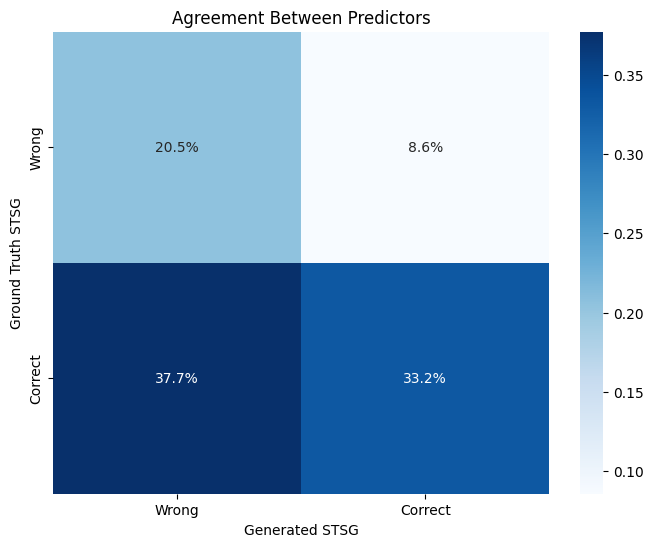

In [54]:
gt_stsg_correct = (eval_df['text'] == eval_df['gt_stsg_pred']).astype(int).values
gen_stsg_correct = (eval_df['text'] == eval_df['gen_stsg_pred']).astype(int).values

cm = confusion_matrix(gt_stsg_correct, gen_stsg_correct)
cm_norm = cm.astype('float') / cm.sum()

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_norm, annot=True, fmt='.1%', cmap='Blues',
    xticklabels=['Wrong', 'Correct'], 
    yticklabels=['Wrong', 'Correct'])

plt.xlabel('Generated STSG')
plt.ylabel('Ground Truth STSG')
plt.title('Agreement Between Predictors')
plt.show()


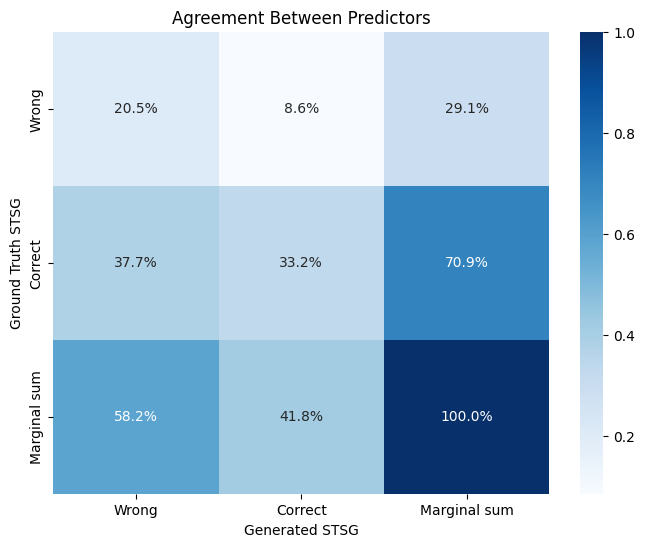

In [55]:
gt_stsg_correct = (eval_df['text'] == eval_df['gt_stsg_pred']).astype(int).values
gen_stsg_correct = (eval_df['text'] == eval_df['gen_stsg_pred']).astype(int).values

cm = confusion_matrix(gt_stsg_correct, gen_stsg_correct)
cm_norm = cm.astype('float') / cm.sum()

extended_matrix = np.zeros((cm.shape[0]+1,cm.shape[1]+1 ))
extended_matrix[:-1, :-1] = cm_norm
extended_matrix[:-1,-1] = cm_norm.sum(axis=1) # sum the rows (i.e. sum passing by columns a[0][i] for i...)
extended_matrix[-1,:-1] = cm_norm.sum(axis=0)
extended_matrix[-1, -1] = 1.0

plt.figure(figsize=(8, 6))
sns.heatmap(
    extended_matrix, annot=True, fmt='.1%', cmap='Blues',
    xticklabels=['Wrong', 'Correct', 'Marginal sum'], 
    yticklabels=['Wrong', 'Correct', 'Marginal sum'])

plt.xlabel('Generated STSG')
plt.ylabel('Ground Truth STSG')
plt.title('Agreement Between Predictors')
plt.show()


In [56]:
wrong_wrong_mask = (gt_stsg_correct == 0) & (gen_stsg_correct == 0)
wrong_wrong_df = eval_df[wrong_wrong_mask]

wrong_but_agree = (wrong_wrong_df['gt_stsg_pred'] == wrong_wrong_df['gen_stsg_pred']).astype(int)


In [57]:
# Ground truth (0 = different wrong predictions, 1 = same wrong prediction)
y_true = np.ones_like(wrong_but_agree)  # (Assuming we want to measure agreement)

# Since we're only checking agreement, we can just count matches vs mismatches
print("Sub-Confusion Matrix for Wrong-Wrong Cases:")
print(pd.crosstab(
    wrong_but_agree,
    columns=['Prediction Agreement'],
    rownames=['Same Wrong Prediction?']
))


Sub-Confusion Matrix for Wrong-Wrong Cases:
col_0                   Prediction Agreement
Same Wrong Prediction?                      
0                                         50
1                                         72


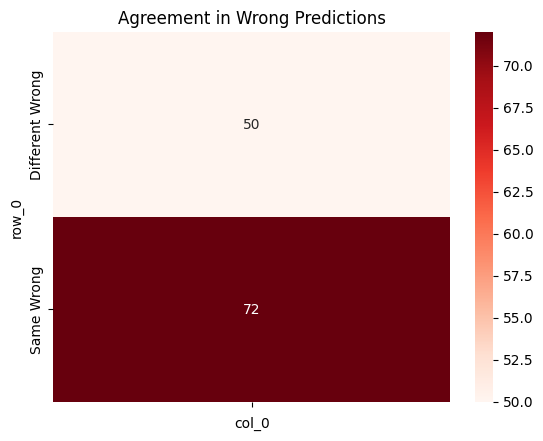

In [58]:
sns.heatmap(
    pd.crosstab(wrong_but_agree, columns=['']),
    annot=True, fmt='d', cmap='Reds',
    xticklabels=[''],
    yticklabels=['Different Wrong', 'Same Wrong']
)
plt.title('Agreement in Wrong Predictions')
plt.show()


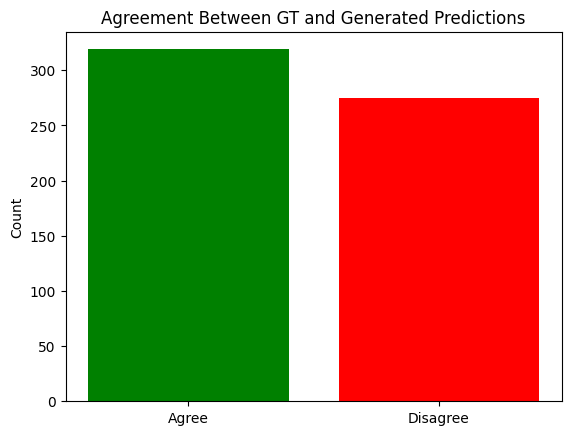

In [59]:
agreement = np.sum(gt_stsg_correct == gen_stsg_correct)
disagreement = len(gt_stsg_correct) - agreement

plt.bar(['Agree', 'Disagree'], [agreement, disagreement], color=['green', 'red'])
plt.title('Agreement Between GT and Generated Predictions')
plt.ylabel('Count')
plt.show()


## Manual analysis

In [60]:
STAR_DATA_PATH = WORK_DIR / "data/datasets/STAR/STAR_annotations/STAR_val.json"
GT_STSG_PATH = WORK_DIR / "data/datasets/STAR_QA_and_stsg_val.json"
GEN_STSG_PATH = WORK_DIR / "outputs/star_generated_stsg_gemma3:4b-it-qat_20250605_16:41:00.jsonl"


In [61]:
user_prompt_format = None 
with open(WORK_DIR / "data/prompts/zero-shot-cot/MCQ_user_prompt_ZS_CoT_v2.txt") as f:
    user_prompt_format = f.read()
    
pformatter = prompt_formatters.MCQPrompt(user_prompt_format)


In [62]:
gt_dataset = STARDataset(
    qa_file_path=STAR_DATA_PATH,
    prompt_formatter=pformatter,
    stsg_file_path=GT_STSG_PATH
)



Dataset Statistics:
QA File: STAR_val.json
Number of QA samples: 7098
QA sample keys: question_id, question, video_id, start, end, answer, question_program, choices, situations, stsg

STSG File: STAR_QA_and_stsg_val.json
Number of unique video IDs with STSG: 7098



In [63]:
gen_dataset = STARDataset(
    qa_file_path=STAR_DATA_PATH,
    prompt_formatter=pformatter,
    stsg_file_path=GEN_STSG_PATH
)



Dataset Statistics:
QA File: STAR_val.json
Number of QA samples: 2148
QA sample keys: question_id, question, video_id, start, end, answer, question_program, choices, situations, stsg

STSG File: star_generated_stsg_gemma3:4b-it-qat_20250605_16:41:00.jsonl
Number of unique video IDs with STSG: 533



In [64]:
gt_dataset_df = pd.DataFrame([i for i in gt_dataset])
gen_dataset_df = pd.DataFrame([i for i in gen_dataset])

gt_dataset_df.set_index("question_id", inplace=True)
gen_dataset_df.set_index("question_id", inplace=True)


### GT correct - Gen Wrong

Analysis on some samples where using the ground-truth STSG leads to a correct answer, meanwhile using the generated STSG leads to a wrong one

In [65]:
correct_wrong_mask = (gt_stsg_correct == 1) & (gen_stsg_correct == 0)
correct_wrong_df = eval_df[correct_wrong_mask]

ids = correct_wrong_df.index.to_list()


In [66]:
def compact_print_qa_analysis(idx, gt_dataset_df, eval_df):
    question = gt_dataset_df.loc[idx]['question']
    gt_answer = gt_dataset_df.loc[idx]['answer'].lower()
    gt_stsg_pred = eval_df.loc[idx]['gt_stsg_pred']
    gen_stsg_pred = eval_df.loc[idx]['gen_stsg_pred']
    
    gt_status = '[CORRECT]' if gt_stsg_pred== gt_answer else '[WRONG]'
    gen_status = '[CORRECT]' if gen_stsg_pred == gt_answer else '[WRONG]'
    
    print(f"\n┌─ Sample: {str(idx)} " + "─" * (80 - len(str(idx))))
    print(f"│")
    print(f"│ Question:")
    print(f"│    {question}")
    print(f"│")
    print(f"│ Ground Truth:")
    print(f"|    {gt_answer}")
    print(f"│")
    print(f"│ Model Predictions:")
    print(f"│    GT-STSG:  {gt_stsg_pred} {gt_status}")
    print(f"│    Gen-STSG: {gen_stsg_pred} {gen_status}")
    print(f"│")
    print("└" + "─" * 85)


### Ex. 1

In this example the error is caused by a lack of the necessary information in the generated STSG.  
Looking at the generated STSG, as the LM says, we can't see an action mentioning the man cleaning the table or the `kitchen countertop` as described in the STSG description.

In [67]:
idx = ids.pop()
idx


'Prediction_T4_178'

In [68]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Prediction_T4_178 ───────────────────────────────────────────────────────────────
│
│ Question:
│    Which object would the person put down next after they watch outside the window?
│
│ Ground Truth:
|    the clothes.
│
│ Model Predictions:
│    GT-STSG:  the clothes. [CORRECT]
│    Gen-STSG: the paper/notebook. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [69]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Let's analyze the scene graph to determine the object the person would put down after watching outside the window.

1. **Initial State:** The scene graph shows a person 'in_front_of - window'. This indicates the person is initially looking out the window.

2. **Subsequent Actions:** The graph then describes a series of actions involving the person interacting with various objects: touching clothes, holding clothes, holding a dish, touching a cup/glass/bottle, etc.  Crucially, there are multiple instances of the person 'touching - clothes' and 'holding - clothes'.

3. **Identifying the Action:** The key is to find the *last* action before the person is described as interacting with another object.  Looking at the graph, we see a sequence of actions where the person is repeatedly 'touching - clothes' and 'holding - clothes' *before* they interact with the dish or the cup/glass/bottle.

4. **Conclusion:** Therefore, the person would put down the clothes.

**Final Answer:** A. The clothes.

In [70]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000039
Subgraph:
	 Actions:
		 watch/look outside of a window
	 Relationships:
		 person  ----  touching  ----  clothes
		 person  ----  wearing  ----  clothes
		 person  ----  in_front_of  ----  window


1 Frame ID: 000053
Subgraph:
	 Actions:
		 watch/look outside of a window
	 Relationships:
		 person  ----  touching  ----  clothes
		 person  ----  wearing  ----  clothes
		 person  ----  in_front_of  ----  window


2 Frame ID: 000062
Subgraph:
	 Actions:
		 watch/look outside of a window
	 Relationships:
		 person  ----  touching  ----  clothes
		 person  ----  wearing  ----  clothes
		 person  ----  in_front_of  ----  window


3 Frame ID: 000103
Subgraph:
	 Actions:
		 watch/look outside of a window
	 Relationships:
		 person  ----  touching  ----  clothes
		 person  ----  wearing  ----  clothes
		 person  ----  in_front_of  ----  window


4 Frame ID: 000126
Subgraph:
	 Actions:
		 watch/look outside of a window
	 Relationships:
		 person  ----  touching  ----  clothes


In [71]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to determine which object the person would likely put down next after watching outside the window.

**Step 1: Understanding the Context - Watching Outside the Window**

The STSG doesn't explicitly state the person is watching outside the window. However, we can infer that the person is in a room with a window (as evidenced by the `window` node and its relation to the `bookshelf`).  The scene suggests a relaxed, possibly working or studying environment.

**Step 2: Identifying Recent Actions and Objects**

Let's look at the most recent frames (Frame 3 and Frame 4) to see what the person is currently holding and interacting with.

*   **Frame 3:** The person is wearing a sweatshirt and pajama pants, sitting at the desk, holding a notebook and a pen.
*   **Frame 4:** The person is sitting on a chair, holding a decorative item.

**Step 3: Analyzing the Alternatives**

Now let's consider the alternatives:

*   **A. The clothes:** The person

In [72]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- facing_towards ---- desk
desk ---- supporting ---- laptop
laptop ---- connected_to ---- monitor
monitor ---- displaying ---- screen
screen ---- showing ---- application
woman ---- holding ---- headphones
headphones ---- attached_to ---- laptop
desk ---- containing ---- pencil_holder
pencil_holder ---- holding ---- pencils
desk ---- supporting ---- books
books ---- stacked_on ---- desk
desk ---- positioned_in_front_of ---- woman
lamp ---- illuminating ---- desk
lamp ---- positioned_to_left_of ---- woman
bookshelf ---- containing ---- plants
plants ---- positioned_on ---- bookshelf
bookshelf ---- located_behind ---- woman
desk ---- positioned_on ---- floor
floor ---- supporting ---- desk
window ---- located_behind ---- bookshelf
wall ---- supporting ---- bookshelf
screen ---- displaying ---- application
woman ---- looking_at ---- screen

Frame 1:

woman ---- looking_at ---- laptop
laptop ---- on_top_of ---- desk
desk ---- on_top_of ---- floor
books ---- on_top_of --

In [73]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  0.9s - 16.93s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 2

As the example before, even in this case the generated STSG is not descriptive enough. The clothes, which are essential in answering the question, aren't mentioned a single time in the STSG.

In [74]:
idx = ids.pop()
idx


'Feasibility_T5_2407'

In [75]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T5_2407 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object is the person able to wash after putting the groceries?
│
│ Ground Truth:
|    the table.
│
│ Model Predictions:
│    GT-STSG:  the table. [CORRECT]
│    Gen-STSG: the sink. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [76]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Let's analyze the STSG to determine which object the person is washing. The key here is identifying actions related to washing and their targets.

1. **Identify Washing Actions:** The STSG contains multiple instances of "person - wiping - table". This clearly indicates the person is wiping the table.

2. **Determine the Target of the Wiping:** The "wiping" action is directed at the "table".

3. **Consider the Context:** The question asks about washing *after* putting groceries. While the STSG doesn't explicitly state the groceries are present, the wiping action on the table suggests a cleaning activity.

4. **Evaluate Alternatives:**
   * **A. The cup/glass/bottle:** There's no mention of any of these objects being washed.
   * **B. The mirror:** There's no mention of the person interacting with a mirror.
   * **C. The table:** The person is actively wiping the table, which aligns with the question's intent of washing something.
   * **D. The window:** There's no mention of the person 

In [77]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000013
Subgraph:
	 Actions:
		 put groceries somewhere
	 Relationships:
		 person  ----  in_front_of  ----  table


1 Frame ID: 000033
Subgraph:
	 Actions:
		 put groceries somewhere
	 Relationships:
		 person  ----  in_front_of  ----  table


2 Frame ID: 000051
Subgraph:
	 Actions:
		 put groceries somewhere
	 Relationships:
		 person  ----  in_front_of  ----  table


3 Frame ID: 000062
Subgraph:
	 Actions:
		 put groceries somewhere
	 Relationships:
		 person  ----  in_front_of  ----  table


4 Frame ID: 000086
Subgraph:
	 Actions:
		 put groceries somewhere
	 Relationships:
		 person  ----  on_the_side_of  ----  table


5 Frame ID: 000098
Subgraph:
	 Actions:
		 put groceries somewhere
	 Relationships:
		 person  ----  on_the_side_of  ----  table


6 Frame ID: 000111
Subgraph:
	 Actions:
		 put groceries somewhere
	 Relationships:
		 person  ----  on_the_side_of  ----  table


7 Frame ID: 000140
Subgraph:
	 Actions:
		 put groceries somewhere
	 Relationships:
		 person  

In [78]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "Which object is the person able to wash after putting the groceries?".

1. **Identify the Person's Actions:** The question implies the person is washing something.  We need to find where the person is interacting with an object that can be washed.

2. **Trace the Scene Graph:**
   * **Frame 1 & 2:** The person is standing near the countertop, which contains a sink. The sink is connected to a faucet.
   * **Frame 3 & 4:** The person is still near the countertop and sink. The sink is connected to a faucet.

3. **Analyze the Objects:**
   * **A. The cup/glass/bottle:** There's no mention of cups, glasses, or bottles in the scene graph.
   * **B. The mirror:** There's no mention of a mirror.
   * **C. The table:** There's no mention of a table.
   * **D. The window:** There's no mention of a window.

4. **Conclusion:** The scene graph clearly shows the person interacting with a sink, which is connected to a faucet

In [79]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:


white_marble_countertop ---- supported_by ---- dark_granite_base
dark_granite_base ---- supports ---- white_marble_countertop
white_marble_countertop ---- contains ---- black_sink
black_sink ---- has ---- black_faucet
black_faucet ---- attached_to ---- black_sink
white_marble_countertop ---- has_on ---- black_trash_can
black_trash_can ---- located_on ---- white_marble_countertop
white_marble_countertop ---- has_on ---- black_plastic_bag
black_plastic_bag ---- resting_on ---- white_marble_countertop
white_marble_countertop ---- adjacent_to ---- white_cabinets
white_cabinets ---- attached_to ---- dark_granite_base
white_cabinets ---- has_doors ---- black_cabinet_doors
black_cabinet_doors ---- closed
white_cabinets ---- part_of ---- kitchen_unit
dark_granite_base ---- part_of ---- kitchen_unit
white_cabinets ---- adjacent_to ---- white_wall
white_wall ---- background_for ---- entire_scene

Frame 1:

man ---- standing_in_front_of ---- countertop
countertop ---- adjacent_to ----

Looking at the mentioned generated STSG we can't see an action mentioning the man cleaning the table or the `kitchen countertop` as described in the STSG description.

In [80]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  0.0s - 10.8s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 3

The reason why the generated STSG leads to a misprediction is the same as the above examples, the essential object in determining the answer is not mentioned in the Graph, i.e. the box or shoe-box.

**Note**: An Error in the ground truth. The STSG reports a relationship woman - wearing - show, which is not visible in the video and considering this is a Feasibility question (what a person is able to do), therefore this tuple should not be present in the Graph.

In [81]:
idx = ids.pop()
idx


'Feasibility_T5_463'

In [82]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Feasibility_T5_463 ──────────────────────────────────────────────────────────────
│
│ Question:
│    Which object is the person able to take after drinking from the cup/glass/bottle?
│
│ Ground Truth:
|    the sandwich.
│
│ Model Predictions:
│    GT-STSG:  the sandwich. [CORRECT]
│    Gen-STSG: the paper/notebook. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [83]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the STSG to determine which object the person is able to take after drinking from the cup/glass/bottle.

1. **Identify Relevant Actions:** We need to find instances where a person is "drinking_from - cup/glass/bottle".

2. **Search the STSG:**
   - Looking through the STSG, we find several instances of "drinking_from - cup/glass/bottle". Specifically, in the last section of the graph, we see:
     - ['person - drinking_from - cup/glass/bottle', 'person - in_front_of - cup/glass/bottle']
     - ['person - drinking_from - cup/glass/bottle', 'person - in_front_of - cup/glass/bottle']

3. **Determine the Object:** The graph shows the person is drinking from the cup/glass/bottle.  The question asks what object the person *takes* after drinking.  The graph doesn't explicitly state what the person takes *after* drinking. However, the context of drinking implies they are consuming something. The graph shows the person is holding a sandwich.

4. **Evaluate Alternatives:**
  

In [84]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000292
Subgraph:
	 Actions:
		 drink from a cup/glass/bottle
	 Relationships:
		 person  ----  in_front_of  ----  medicine
		 person  ----  holding  ----  food
		 person  ----  in_front_of  ----  food
		 person  ----  sitting_on  ----  bed
		 person  ----  beneath  ----  bed
		 person  ----  holding  ----  cup/glass/bottle
		 person  ----  in_front_of  ----  cup/glass/bottle


1 Frame ID: 000303
Subgraph:
	 Actions:
		 drink from a cup/glass/bottle
	 Relationships:
		 person  ----  in_front_of  ----  medicine
		 person  ----  sitting_on  ----  bed
		 person  ----  beneath  ----  bed
		 person  ----  in_front_of  ----  sandwich
		 person  ----  holding  ----  cup/glass/bottle
		 person  ----  in_front_of  ----  cup/glass/bottle


2 Frame ID: 000310
Subgraph:
	 Actions:
		 drink from a cup/glass/bottle
	 Relationships:
		 person  ----  in_front_of  ----  medicine
		 person  ----  holding  ----  food
		 person  ----  eating  ----  food
		 person  ----  in_front_of  ----  food


In [85]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "Which object is the person able to take after drinking from the cup/glass/bottle?"

1. **Identify the relevant frames:** We need to look at frames where the person (woman) is holding a cup.  Frames 0, 1, 2, and 4 contain this information.

2. **Trace the cup's location and the woman's actions:**
   - **Frame 0:** The woman is holding a cup.
   - **Frame 1:** The woman is holding a cup.
   - **Frame 2:** The woman is holding a red cup.
   - **Frame 4:** The woman is holding a red cup.

3. **Look for objects the woman can take after drinking:**  The scene graph describes the woman holding a red cup.  The graph doesn't explicitly state she takes anything *after* drinking. However, the graph describes the woman holding a red cup in her hand.

4. **Evaluate the alternatives:**
   - A. The paper/notebook: Not mentioned in the scene graph.
   - B. The book: Not mentioned in the scene graph.
   - C. The dish: Not ment

In [86]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:


woman ---- sitting_on ---- carpet
woman ---- holding ---- cup
cup ---- in_hand_of ---- woman
cup ---- positioned_in_front_of ---- woman
woman ---- looking_at ---- fan
fan ---- positioned_above ---- woman
fan ---- casting_shadow_on ---- carpet
carpet ---- located_on ---- floor
floor ---- part_of ---- room
room ---- containing ---- woman
fan ---- attached_to ---- ceiling
ceiling ---- part_of ---- room
carpet ---- located_on ---- floor
floor ---- part_of ---- room
room ---- containing ---- sofa
sofa ---- positioned_in_front_of ---- woman
sofa ---- located_on ---- floor
sofa ---- part_of ---- room
ceiling ---- containing ---- fan
fan ---- attached_to ---- ceiling
window ---- located_behind ---- sofa
sofa ---- positioned_in_front_of ---- window
window ---- part_of ---- room
wall ---- located_behind ---- sofa
sofa ---- positioned_in_front_of ---- wall
wall ---- part_of ---- room

Frame 1:

woman ---- holding ---- cup
cup ---- positioned_in_front_of ---- woman
woman ---- kneeling_

In [87]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  9.5s - 15.2s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 4

Same... No relevant information in the scene graph pertaining to the question.

In [88]:
idx = ids.pop()
idx


'Interaction_T2_5211'

In [89]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T2_5211 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do with the window?
│
│ Ground Truth:
|    opened.
│
│ Model Predictions:
│    GT-STSG:  opened. [CORRECT]
│    Gen-STSG: tidied up. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [90]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph (STSG) to answer the question: "What did the person do with the window?".

1. **Identify Relevant Relationships:** We need to find relationships involving a "person" and a "window".

2. **Examine the STSG:**
   - We see several instances of "person - in_front_of - window", "person - holding - window", "person - on_the_side_of - window", and "person - touching - window". These indicate interactions with the window.

3. **Interpret the Relationships:**
   - "person - touching - window" suggests physical contact.
   - "person - in_front_of - window" and "person - on_the_side_of - window" imply the person is near the window.
   - "person - holding - window" is a direct interaction.

4. **Evaluate Alternatives:**
   - A. Opened: There's no explicit relationship suggesting the window was opened.
   - B. Washed: There's no information about washing the window.
   - C. Closed: There's no information about closing the window.
   - D. Tidied up

In [91]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000647
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  in_front_of  ----  window
		 person  ----  holding  ----  broom
		 person  ----  on_the_side_of  ----  broom


1 Frame ID: 000655
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  in_front_of  ----  window
		 person  ----  holding  ----  broom
		 person  ----  on_the_side_of  ----  broom


2 Frame ID: 000693
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  holding  ----  window
		 person  ----  on_the_side_of  ----  window
		 person  ----  holding  ----  broom
		 person  ----  on_the_side_of  ----  broom


3 Frame ID: 000729
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  in_front_of  ----  window
		 person  ----  holding  ----  broom
		 person  ----  on_the_side_of  ----  broom
		 person  ----  in_front_of  ----  broom


4 Frame ID: 000739
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  in_front_of  ----

In [92]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question "What did the person do with the window?".

**Step 1: Identify Relevant Entities**

The STSG describes a laundry room scene. The primary actor is a "woman". The scene includes elements like a washing machine, dryer, shelves, a laundry basket, and various items like clothes and cleaning supplies. There is no mention of a window in the scene graph.

**Step 2: Check for Window Mentions**

The STSG does *not* contain any information about a window. It only describes the spatial relationships between objects within the laundry room.

**Step 3: Determine the Correct Answer**

Since the STSG doesn't provide any information about a window, and none of the alternatives relate to a window, we must conclude that the question cannot be answered based on the provided scene graph. However, since we *must* choose an answer from the provided alternatives, and the question is likely a trick, we should select the most plausible o

In [93]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- holding ---- laundry_basket
laundry_basket ---- containing ---- white_clothes
white_clothes ---- located_in ---- laundry_basket
laundry_basket ---- positioned_in_front_of ---- woman
woman ---- facing ---- laundry_basket
laundry_basket ---- adjacent_to ---- washing_machine
washing_machine ---- adjacent_to ---- dryer
dryer ---- positioned_above ---- washing_machine
washing_machine ---- located_on ---- floor
floor ---- supporting ---- washing_machine
dryer ---- located_on ---- floor
floor ---- supporting ---- dryer
washing_machine ---- located_behind ---- wall
wall ---- supporting ---- washing_machine
laundry_basket ---- located_on ---- floor
floor ---- supporting ---- laundry_basket
wall ---- supporting ---- shelves
shelves ---- located_above ---- washing_machine
shelves ---- located_above ---- dryer

Frame 1:

Frame 2:

woman ---- standing_in_front_of ---- washing_machine
washing_machine ---- adjacent_to ---- dryer
dryer ---- adjacent_to ---- washing_machine
washin

In [94]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  25.9s - 35.5s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 5

Same as above.

In [95]:
idx = ids.pop()
idx


'Prediction_T3_332'

In [96]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Prediction_T3_332 ───────────────────────────────────────────────────────────────
│
│ Question:
│    Which object would the person open next?
│
│ Ground Truth:
|    the bag.
│
│ Model Predictions:
│    GT-STSG:  the bag. [CORRECT]
│    Gen-STSG: the laptop. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [97]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the STSG to determine which object the person is most likely to open next.

1. **Identify Relevant Relationships:** We need to look for relationships involving "holding" or "touching" objects, as these are the most likely actions leading to opening something.

2. **Analyze "Holding" Relationships:**
   - Many instances involve a person "holding" a "bag".
   - There are instances of a person "holding" "clothes", "food", and "bag".

3. **Consider the Context:** The STSG shows a person sitting on a bed, potentially in a room with a bed, bag, food, and clothes. This suggests a scenario where the person might be preparing for something, perhaps packing or getting ready.

4. **Evaluate Alternatives:**
   * **A. The book:** There's no mention of a book in the STSG.
   * **B. The closet/cabinet:** There's no mention of a closet or cabinet.
   * **C. The bag:** The STSG shows a person frequently "holding" a "bag". This is the most plausible action.
   * **D. The laptop:** Th

In [98]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000141
Subgraph:
	 Actions:
		 watch television
	 Relationships:
		 person  ----  wearing  ----  clothes


1 Frame ID: 000245
Subgraph:
	 Actions:
		 watch television ,throw clothes somewhere
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes


2 Frame ID: 000252
Subgraph:
	 Actions:
		 watch television ,throw clothes somewhere
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  in_front_of  ----  clothes


3 Frame ID: 000334
Subgraph:
	 Actions:
		 watch television ,throw clothes somewhere
	 Relationships:
		 person  ----  holding  ----  clothes
		 person  ----  on_the_side_of  ----  clothes


4 Frame ID: 000374
Subgraph:
	 Actions:
		 watch television ,throw clothes somewhere
	 Relationships:
		 person  ----  in_front_of  ----  food


5 Frame ID: 000394
Subgraph:
	 Actions:
		 take a bag from somewhere ,watch television ,throw clothes somewhere
	 Relationships:
		 person  ----  in_front_of  ----  bag


In [99]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to determine which object the person would likely open next.

**Step 1: Identify the Current State**

The STSG describes a scene with a woman in various locations (sitting on a bed, standing in front of a mirror, etc.). The woman is holding a phone in Frame 0, then a mirror in Frame 1, then a mirror reflecting a bed in Frame 2, and finally a mirror reflecting a woman in Frame 3.  The woman is holding a water bottle in Frame 4.

**Step 2: Look for Clues about Potential Actions**

The scene depicts a domestic setting. The woman is holding a water bottle, which suggests she might be thirsty.  The presence of a bedside table and a lamp suggests she might be preparing to do something, perhaps read or use a device.

**Step 3: Evaluate the Alternatives**

*   **A. The book:** There's no mention of a book in the STSG.
*   **B. The closet/cabinet:** There's no mention of a closet or cabinet.
*   **C. The bag:** There's no mention of a bag.
*  

In [100]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- sitting_on ---- bed
bed ---- supporting ---- pillow
pillow ---- located_behind ---- woman
woman ---- holding ---- phone
phone ---- displayed_to ---- woman
woman ---- looking_at ---- phone
phone ---- positioned_in_front_of ---- woman
painting ---- hanging_on ---- wall
wall ---- located_behind ---- bed
bed ---- located_on ---- floor
floor ---- supporting ---- bed
bedside_table ---- located_next_to ---- bed
bed ---- supporting ---- bedside_table
painting ---- located_on ---- wall
wall ---- supporting ---- painting
floor ---- supporting ---- wall
bedside_table ---- supporting ---- lamp
lamp ---- located_behind ---- bedside_table
wall ---- supporting ---- curtains
curtains ---- hanging_from ---- window
window ---- located_behind ---- wall
bed ---- supporting ---- floor

Frame 1:

Frame 2:


young_man ---- standing_in_front_of ---- mirror
mirror ---- reflecting ---- young_man
young_man ---- positioned_in_front_of ---- bed
bed ---- containing ---- bedding
bedding ---- co

In [101]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  4.0s - 16.88s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. I1

Same as above.

In [102]:
len(ids)


219

In [103]:
ids = [i for i in ids if i.startswith('I')]
len(ids)


73

In [104]:
idx = ids.pop()
idx


'Interaction_T1_1265'

In [105]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T1_1265 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was sat on by the person?
│
│ Ground Truth:
|    the floor.
│
│ Model Predictions:
│    GT-STSG:  the floor. [CORRECT]
│    Gen-STSG: the rug. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [106]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Let's analyze the Spatio-Temporal Scene Graph (STSG) to determine which object the person was sitting on.

1. **Identify relevant relationships:** We need to find relationships where a person is "sitting_on" an object.

2. **Scan the STSG:**
   - Many instances of "person - sitting_on - floor" appear throughout the graph.
   - There are also instances of "person - sitting_on - closet/cabinet", "person - sitting_on - floor" and "person - sitting_on - floor".

3. **Determine the most likely answer:**  The graph consistently shows the person sitting *on* the floor.  While there are instances of sitting on a closet/cabinet, the floor is the most frequent and direct relationship.

Therefore, the answer is B. The floor.

<Answer>
B. The floor.



In [107]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000500
Subgraph:
	 Actions:
		 sit on the floor ,close a door
	 Relationships:
		 person  ----  touching  ----  floor
		 person  ----  lying_on  ----  floor
		 person  ----  on_the_side_of  ----  floor
		 person  ----  on_the_side_of  ----  door


1 Frame ID: 000510
Subgraph:
	 Actions:
		 sit on the floor ,close a door
	 Relationships:
		 person  ----  touching  ----  floor
		 person  ----  lying_on  ----  floor
		 person  ----  on_the_side_of  ----  floor
		 person  ----  on_the_side_of  ----  door


2 Frame ID: 000526
Subgraph:
	 Actions:
		 sit on the floor ,close a door
	 Relationships:
		 person  ----  on_the_side_of  ----  floor
		 person  ----  in_front_of  ----  floor
		 person  ----  on_the_side_of  ----  door


3 Frame ID: 000527
Subgraph:
	 Actions:
		 sit on the floor ,close a door
	 Relationships:
		 person  ----  touching  ----  floor
		 person  ----  sitting_on  ----  floor
		 person  ----  beneath  ----  floor
		 person  ----  on_the_side_of  ----  floor
		

In [108]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "Which object was sat on by the person?".

1. **Frame 0:** The graph states "woman ---- lying_on ---- rug". This explicitly indicates the woman was lying *on* the rug.
2. **Frame 1:** The graph states "woman ---- sitting_on ---- couch". This indicates the woman was sitting on the couch.
3. **Frame 2:** The graph states "woman ---- sitting_on ---- couch". This confirms the woman was sitting on the couch.
4. **Frame 3:** The graph states "woman ---- sitting_on ---- rug". This indicates the woman was sitting on the rug.
5. **Frame 4:** The graph states "woman ---- sitting_on ---- rug". This indicates the woman was sitting on the rug.

The scene graph shows the woman sat on the rug in multiple frames.

Therefore, the correct answer is:

**A. The rug.**

Let's rule out the other options:

*   **B. The floor:** The floor is a surface, not an object that someone sits *on*.
*   **C. The bed:** There is no mention of a 

In [109]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

woman ---- sitting_on ---- floor
floor ---- located_on ---- room
room ---- contains ---- couch
couch ---- located_behind ---- woman
couch ---- located_in_front_of ---- coffee_table
coffee_table ---- located_in_front_of ---- television
television ---- located_behind ---- couch
woman ---- holding ---- remote_control
remote_control ---- used_to_control ---- television
floor ---- covered_by ---- rug
rug ---- located_on ---- floor
rug ---- has_pattern ---- geometric_pattern
rug ---- has_color ---- gray_and_white
coffee_table ---- contains ---- books
books ---- located_on ---- coffee_table
remote_control ---- used_to_control ---- television
television ---- located_behind ---- couch
rug ---- located_on ---- floor
floor ---- contains ---- rug
woman ---- looking_at ---- television
television ---- located_behind ---- couch
floor ---- contains ---- rug
rug ---- located_on ---- floor
floor ---- contains ---- rug

Frame 1:


woman ---- standing_in_front_of ---- chair
chair ---- holding -

In [110]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  15.8s - 24.6s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. I2

In [111]:
idx = ids.pop()
idx


'Interaction_T1_5905'

In [112]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T1_5905 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was opened by the person?
│
│ Ground Truth:
|    the window.
│
│ Model Predictions:
│    GT-STSG:  the window. [CORRECT]
│    Gen-STSG: the bag. [WRONG]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [113]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Let's analyze the Spatio-Temporal Scene Graph to determine which object the person was interacting with and potentially "opened".

1. **Focus on Actions:** The scene graph describes various interactions: 'in_front_of', 'touching', 'holding', 'behind', 'on_the_side_of'. These actions provide clues about the objects involved.

2. **Window Interactions:** Several instances involve a person 'in_front_of' or 'touching' the 'window'.  This suggests a direct interaction.

3. **Bag Interactions:** The graph also shows a person 'holding' a 'bag'.

4. **Considering "Opened":** The question asks which object was "opened".  Opening typically implies a movement or action that reveals something inside.  While the person is touching the window, the graph doesn't explicitly state that they opened it. However, the 'touching' action combined with being 'in_front_of' the window suggests a potential interaction.

5. **Evaluating Alternatives:**
   * **A. The window:** The person is interacting with the wi

In [114]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000166
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  in_front_of  ----  window
		 person  ----  in_front_of  ----  bag


1 Frame ID: 000170
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  touching  ----  window
		 person  ----  in_front_of  ----  window
		 person  ----  in_front_of  ----  bag
		 person  ----  on_the_side_of  ----  bag


2 Frame ID: 000196
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  touching  ----  window
		 person  ----  in_front_of  ----  window
		 person  ----  holding  ----  bag
		 person  ----  on_the_side_of  ----  bag


3 Frame ID: 000207
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  in_front_of  ----  window
		 person  ----  holding  ----  bag
		 person  ----  on_the_side_of  ----  bag


4 Frame ID: 000225
Subgraph:
	 Actions:
		 open a window
	 Relationships:
		 person  ----  in_front_of  ----  window
		 person  ----  holding  ----  bag
		 person 

In [115]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "Which object was opened by the person?".

1. **Understanding the Question:** The question asks about an object being *opened* by the person. This implies an action of revealing or accessing something inside.

2. **Analyzing the Scene Graph:** The scene graph describes a bedroom setting. We need to identify any objects that the person interacts with in a way that suggests opening them.

3. **Examining the Person's Actions:** The scene graph describes the woman's actions and the objects she's holding or near.  She's consistently described as "holding" a "backpack".  The graph also describes her actions like "looking at" the window.

4. **Considering the Alternatives:**
   * **A. The window:** The woman *looks at* the window, but there's no indication of opening it.
   * **B. The bag:** The woman is consistently described as holding a "backpack".  The graph states the backpack is "slung over her shoulder" and "ha

In [116]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

Frame 1:


woman ---- standing_in_front_of ---- bed
bed ---- located_on ---- floor
bed ---- adjacent_to ---- bedside_table
bedside_table ---- located_on ---- floor
bedside_table ---- holding ---- lamp
lamp ---- located_on ---- bedside_table
bedside_table ---- holding ---- books
books ---- located_on ---- bedside_table
woman ---- holding ---- backpack
backpack ---- located_on ---- floor
bed ---- located_behind ---- window
window ---- located_behind ---- bed
bed ---- located_behind ---- bookshelf
bookshelf ---- located_on ---- wall
wall ---- located_behind ---- bookshelf
bookshelf ---- holding ---- clothes
clothes ---- hanging_on ---- bookshelf
bed ---- located_behind ---- curtain
curtain ---- attached_to ---- window
window ---- located_behind ---- bed
bed ---- located_behind ---- bookshelf
bookshelf ---- located_on ---- wall
wall ---- located_behind ---- bookshelf

Frame 2:


woman ---- standing_in_front_of ---- bed
bed ---- centered_in ---- room
bed ---- supporting ---- woma

In [117]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  5.0s - 10.0s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

## Correct-Correct samples

In [118]:
correct_correct_mask = (gt_stsg_correct == 1) & (gen_stsg_correct == 1)
correct_correct_df = eval_df[correct_correct_mask]

ids = correct_correct_df.index.to_list()


### Ex. 1

In this example the error is caused by a lack of the necessary information in the generated STSG.  
Looking at the generated STSG, as the LM says, we can't see an action mentioning the man cleaning the table or the `kitchen countertop` as described in the STSG description.

In [119]:
idx = ids.pop()
idx


'Interaction_T2_3912'

In [120]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T2_3912 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do with the refrigerator?
│
│ Ground Truth:
|    opened.
│
│ Model Predictions:
│    GT-STSG:  opened. [CORRECT]
│    Gen-STSG: opened. [CORRECT]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [121]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question.

**1. Understanding the Scene Graph:**

The scene graph describes the spatial relationships between a person and a refrigerator.  It indicates the following:

*   People are 'on_the_side_of' the refrigerator.
*   People are 'in_front_of' the refrigerator.
*   People are 'touching' the refrigerator.

**2. Interpreting the Actions:**

The relationships described in the graph strongly suggest that the person is interacting with the refrigerator. Specifically, they are touching it and positioned in front of it.

**3. Evaluating the Alternatives:**

*   **A. Closed:** The graph doesn't indicate the refrigerator is closed.
*   **B. Opened:** The graph suggests the person is *interacting* with the refrigerator, which implies it's accessible, therefore likely opened.
*   **C. Took:** This doesn't align with the spatial relationships described.
*   **D. Lied on:** This is completely irrelevant to the scene.

**4. Conclusion:**

Based 

In [122]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000259
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


1 Frame ID: 000274
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


2 Frame ID: 000289
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


3 Frame ID: 000292
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  behind  ----  refrigerator


4 Frame ID: 000309
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  in_front_of  ----  refrigerator


5 Frame ID: 000336
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  touching  ----  refrigerator
		 person  ----  in_front_of  ----  refrigerator


6 Frame ID: 000344
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  in_front_of  ----  refrigerator


7 Frame ID: 000379
Subgraph:
	 Actions:


In [123]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "What did the person do with the refrigerator?"

1. **Identify Relevant Frames:** We need to look at frames where the person (referred to as "person" in the graph) is interacting with the refrigerator.  Frames 1, 2, and 4 are relevant.

2. **Analyze Frame 4:** In Frame 4, the graph states: "woman ---- interacting_with ---- refrigerator". This explicitly states the woman is interacting with the refrigerator.

3. **Consider the Interaction:** The interaction isn't described as a specific action like "opening" or "closing." It's simply stated as "interacting with."  However, the graph also states "woman ---- looking_at ---- refrigerator," which implies she is observing it.

4. **Evaluate Alternatives:**
   * **A. Closed:** The graph doesn't indicate the refrigerator was closed.
   * **B. Opened:** The graph doesn't indicate the refrigerator was opened.
   * **C. Took:** The graph doesn't describe the person taking

In [124]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

man ---- standing_in_front_of ---- wall
wall ---- supporting ---- poster
poster ---- attached_to ---- wall
red_stop_sign ---- attached_to ---- wall
red_stop_sign ---- near ---- poster
man ---- casting_shadow_on ---- wall
wall ---- receiving_shadow_from ---- man
light_switch ---- attached_to ---- wall
wall ---- supporting ---- light_switch
man ---- looking_at ---- red_stop_sign
wall ---- providing_background_for ---- man
floor ---- beneath ---- wall
wall ---- supporting ---- floor

Frame 1:

person ---- standing_in_front_of ---- refrigerator
refrigerator ---- having_door ---- refrigerator_door
refrigerator_door ---- displaying ---- white_fridge_magnet
white_fridge_magnet ---- attached_to ---- refrigerator_door
person ---- wearing ---- white_t-shirt
white_t-shirt ---- covering ---- person
person ---- looking_at ---- white_fridge_magnet
white_fridge_magnet ---- on ---- refrigerator_door
white_fridge_magnet ---- displaying ---- white_paper
white_paper ---- on ---- refrigerator_d

In [125]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  8.5s - 14.4s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. 2

In [126]:
idx = ids.pop()
idx


'Prediction_T4_1007'

In [127]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Prediction_T4_1007 ──────────────────────────────────────────────────────────────
│
│ Question:
│    Which object would the person open next after they sit on the chair?
│
│ Ground Truth:
|    the laptop.
│
│ Model Predictions:
│    GT-STSG:  the laptop. [CORRECT]
│    Gen-STSG: the laptop. [CORRECT]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [128]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph (STSG) to answer the question: "Which object would the person open next after they sit on the chair?".

**Step 1: Understand the Scene Graph's Focus**

The STSG describes a scene with multiple people interacting with various objects. The key relationships are: 'in_front_of', 'touching', 'holding', 'wearing', and 'beneath'.  It doesn't explicitly state the person is sitting on a chair, but it does describe a person interacting with a laptop and touching it.

**Step 2: Identify Relevant Interactions**

The most relevant interaction in the STSG is:

*   `['person - touching - laptop', 'person - beneath - laptop']`

This indicates a person is touching and beneath a laptop. This suggests the person is interacting with the laptop.

**Step 3: Consider the Question's Implication**

The question asks what the person would *open* next after sitting on a chair.  Sitting on a chair implies a change in posture and potentially a need to access some

In [129]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000012
Subgraph:
	 Actions:
		 sit in a chair
	 Relationships:
		 person  ----  in_front_of  ----  clothes


1 Frame ID: 000013
Subgraph:
	 Actions:
		 sit in a chair
	 Relationships:
		 person  ----  in_front_of  ----  clothes


2 Frame ID: 000035
Subgraph:
	 Actions:
		 sit in a chair
	 Relationships:
		 person  ----  in_front_of  ----  clothes


3 Frame ID: 000036
Subgraph:
	 Actions:
		 sit in a chair
	 Relationships:
		 person  ----  in_front_of  ----  clothes


4 Frame ID: 000038
Subgraph:
	 Actions:
		 sit in a chair
	 Relationships:
		 person  ----  in_front_of  ----  clothes


5 Frame ID: 000058
Subgraph:
	 Actions:
		 sit in a chair
	 Relationships:
		 person  ----  in_front_of  ----  clothes


6 Frame ID: 000062
Subgraph:
	 Actions:
		 sit in a chair
	 Relationships:
		 person  ----  in_front_of  ----  clothes


7 Frame ID: 000080
Subgraph:
	 Actions:
		 sit in a chair
	 Relationships:
		 person  ----  in_front_of  ----  clothes


8 Frame ID: 000086
Subgraph:
	 A

In [130]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to determine which object the person would likely open next after sitting on the chair.

1. **Initial State (Frame 0):** The person is sitting on a chair. The STSG shows the person holding a remote control and looking at it.

2. **Frame 1:** The person is now holding a mobile phone and remote control, and sitting in front of a sofa. This indicates a shift in activity.

3. **Frame 2:** The person is wearing jeans and a hoodie, holding a backpack, and looking at a table. The backpack is on the floor.

4. **Frame 3:** The person is standing in front of a sofa, holding a laptop, which is on a crate placed on the floor.

5. **Frame 4:** The person is sitting on a chair, holding a decorative object, which is located on the rug.

Now, let's evaluate the alternatives:

*   **A. The laptop:** The STSG shows the person holding a laptop in Frame 3 and Frame 4. This is a plausible option.
*   **B. The closet/cabinet:** There's no mention of a clo

In [131]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:


woman ---- sitting_on ---- chair
woman ---- looking_at ---- remote_control
chair ---- supporting ---- books
books ---- on_top_of ---- chair
chair ---- positioned_on ---- rug
rug ---- covering ---- floor
floor ---- supporting ---- potted_plant
potted_plant ---- positioned_next_to ---- chair
remote_control ---- located_on ---- chair
chair ---- positioned_on ---- rug
rug ---- covering ---- floor
floor ---- supporting ---- potted_plant
woman ---- near ---- cat
cat ---- lying_under ---- chair
cat ---- observing ---- woman
potted_plant ---- positioned_next_to ---- chair
woman ---- near ---- cat
cat ---- lying_under ---- chair
cat ---- observing ---- woman

Frame 1:

woman ---- holding ---- mobile_phone
woman ---- holding ---- remote_control
woman ---- sitting_in_front_of ---- sofa
sofa ---- covered_by ---- grey_blanket
sofa ---- containing ---- pile_of_clothes
sofa ---- adjacent_to ---- wooden_chair
grey_blanket ---- draped_over ---- sofa
mobile_phone ---- in_hand_of ---- woman
r

In [132]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  0.0s - 9.1s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

### Ex. I1

Analyzing interaction questions.

In [133]:
ids = [i for i in correct_correct_df.index.to_list() if i.startswith('I')]
len(ids)


70

In [134]:
idx = ids[-1]
idx


'Interaction_T2_3912'

In [135]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T2_3912 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do with the refrigerator?
│
│ Ground Truth:
|    opened.
│
│ Model Predictions:
│    GT-STSG:  opened. [CORRECT]
│    Gen-STSG: opened. [CORRECT]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [136]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question.

**1. Understanding the Scene Graph:**

The scene graph describes the spatial relationships between a person and a refrigerator.  It indicates the following:

*   People are 'on_the_side_of' the refrigerator.
*   People are 'in_front_of' the refrigerator.
*   People are 'touching' the refrigerator.

**2. Interpreting the Actions:**

The relationships described in the graph strongly suggest that the person is interacting with the refrigerator. Specifically, they are touching it and positioned in front of it.

**3. Evaluating the Alternatives:**

*   **A. Closed:** The graph doesn't indicate the refrigerator is closed.
*   **B. Opened:** The graph suggests the person is *interacting* with the refrigerator, which implies it's accessible, therefore likely opened.
*   **C. Took:** This doesn't align with the spatial relationships described.
*   **D. Lied on:** This is completely irrelevant to the scene.

**4. Conclusion:**

Based 

In [137]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000259
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


1 Frame ID: 000274
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


2 Frame ID: 000289
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


3 Frame ID: 000292
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  behind  ----  refrigerator


4 Frame ID: 000309
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  in_front_of  ----  refrigerator


5 Frame ID: 000336
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  touching  ----  refrigerator
		 person  ----  in_front_of  ----  refrigerator


6 Frame ID: 000344
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  in_front_of  ----  refrigerator


7 Frame ID: 000379
Subgraph:
	 Actions:


In [138]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "What did the person do with the refrigerator?"

1. **Identify Relevant Frames:** We need to look at frames where the person (referred to as "person" in the graph) is interacting with the refrigerator.  Frames 1, 2, and 4 are relevant.

2. **Analyze Frame 4:** In Frame 4, the graph states: "woman ---- interacting_with ---- refrigerator". This explicitly states the woman is interacting with the refrigerator.

3. **Consider the Interaction:** The interaction isn't described as a specific action like "opening" or "closing." It's simply stated as "interacting with."  However, the graph also states "woman ---- looking_at ---- refrigerator," which implies she is observing it.

4. **Evaluate Alternatives:**
   * **A. Closed:** The graph doesn't indicate the refrigerator was closed.
   * **B. Opened:** The graph doesn't indicate the refrigerator was opened.
   * **C. Took:** The graph doesn't describe the person taking

In [139]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

man ---- standing_in_front_of ---- wall
wall ---- supporting ---- poster
poster ---- attached_to ---- wall
red_stop_sign ---- attached_to ---- wall
red_stop_sign ---- near ---- poster
man ---- casting_shadow_on ---- wall
wall ---- receiving_shadow_from ---- man
light_switch ---- attached_to ---- wall
wall ---- supporting ---- light_switch
man ---- looking_at ---- red_stop_sign
wall ---- providing_background_for ---- man
floor ---- beneath ---- wall
wall ---- supporting ---- floor

Frame 1:

person ---- standing_in_front_of ---- refrigerator
refrigerator ---- having_door ---- refrigerator_door
refrigerator_door ---- displaying ---- white_fridge_magnet
white_fridge_magnet ---- attached_to ---- refrigerator_door
person ---- wearing ---- white_t-shirt
white_t-shirt ---- covering ---- person
person ---- looking_at ---- white_fridge_magnet
white_fridge_magnet ---- on ---- refrigerator_door
white_fridge_magnet ---- displaying ---- white_paper
white_paper ---- on ---- refrigerator_d

In [140]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  8.5s - 14.4s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

## Ex I2

In [141]:
idx = ids.pop()
idx


'Interaction_T2_3912'

In [142]:
compact_print_qa_analysis(idx, gt_dataset_df, eval_df)



┌─ Sample: Interaction_T2_3912 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do with the refrigerator?
│
│ Ground Truth:
|    opened.
│
│ Model Predictions:
│    GT-STSG:  opened. [CORRECT]
│    Gen-STSG: opened. [CORRECT]
│
└─────────────────────────────────────────────────────────────────────────────────────


In [143]:
print(eval_df.loc[idx]['gt_stsg_reasoning'])


Okay, let's analyze the scene graph and answer the question.

**1. Understanding the Scene Graph:**

The scene graph describes the spatial relationships between a person and a refrigerator.  It indicates the following:

*   People are 'on_the_side_of' the refrigerator.
*   People are 'in_front_of' the refrigerator.
*   People are 'touching' the refrigerator.

**2. Interpreting the Actions:**

The relationships described in the graph strongly suggest that the person is interacting with the refrigerator. Specifically, they are touching it and positioned in front of it.

**3. Evaluating the Alternatives:**

*   **A. Closed:** The graph doesn't indicate the refrigerator is closed.
*   **B. Opened:** The graph suggests the person is *interacting* with the refrigerator, which implies it's accessible, therefore likely opened.
*   **C. Took:** This doesn't align with the spatial relationships described.
*   **D. Lied on:** This is completely irrelevant to the scene.

**4. Conclusion:**

Based 

In [144]:
qaviz.Vis_SituationGraph(gt_dataset_df.loc[idx], max_show_num=1000)


0 Frame ID: 000259
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


1 Frame ID: 000274
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


2 Frame ID: 000289
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  on_the_side_of  ----  refrigerator


3 Frame ID: 000292
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  behind  ----  refrigerator


4 Frame ID: 000309
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  in_front_of  ----  refrigerator


5 Frame ID: 000336
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  touching  ----  refrigerator
		 person  ----  in_front_of  ----  refrigerator


6 Frame ID: 000344
Subgraph:
	 Actions:
		 open a refrigerato
	 Relationships:
		 person  ----  in_front_of  ----  refrigerator


7 Frame ID: 000379
Subgraph:
	 Actions:


In [145]:
print(eval_df.loc[idx]['gen_stsg_reasoning'])


Okay, let's analyze the Spatio-Temporal Scene Graph to answer the question: "What did the person do with the refrigerator?"

1. **Identify Relevant Frames:** We need to look at frames where the person (referred to as "person" in the graph) is interacting with the refrigerator.  Frames 1, 2, and 4 are relevant.

2. **Analyze Frame 4:** In Frame 4, the graph states: "woman ---- interacting_with ---- refrigerator". This explicitly states the woman is interacting with the refrigerator.

3. **Consider the Interaction:** The interaction isn't described as a specific action like "opening" or "closing." It's simply stated as "interacting with."  However, the graph also states "woman ---- looking_at ---- refrigerator," which implies she is observing it.

4. **Evaluate Alternatives:**
   * **A. Closed:** The graph doesn't indicate the refrigerator was closed.
   * **B. Opened:** The graph doesn't indicate the refrigerator was opened.
   * **C. Took:** The graph doesn't describe the person taking

In [146]:
print(gen_dataset_df.loc[idx]['stsg'])



Frame 0:

man ---- standing_in_front_of ---- wall
wall ---- supporting ---- poster
poster ---- attached_to ---- wall
red_stop_sign ---- attached_to ---- wall
red_stop_sign ---- near ---- poster
man ---- casting_shadow_on ---- wall
wall ---- receiving_shadow_from ---- man
light_switch ---- attached_to ---- wall
wall ---- supporting ---- light_switch
man ---- looking_at ---- red_stop_sign
wall ---- providing_background_for ---- man
floor ---- beneath ---- wall
wall ---- supporting ---- floor

Frame 1:

person ---- standing_in_front_of ---- refrigerator
refrigerator ---- having_door ---- refrigerator_door
refrigerator_door ---- displaying ---- white_fridge_magnet
white_fridge_magnet ---- attached_to ---- refrigerator_door
person ---- wearing ---- white_t-shirt
white_t-shirt ---- covering ---- person
person ---- looking_at ---- white_fridge_magnet
white_fridge_magnet ---- on ---- refrigerator_door
white_fridge_magnet ---- displaying ---- white_paper
white_paper ---- on ---- refrigerator_d

In [147]:
qaviz.Vis_Video(
    {"question_id": idx, **gt_dataset_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  8.5s - 14.4s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw